# Summary

This notebook walks through Latent Dirichlet Allocation (LDA) topic modeling of bills containing the word "education" from CA, NY, NY, PA, and SD. It demonstrates how to load these datasets, clean the data for topic modeling, tokenize and lemmatize terms, then build and examine different topic models.

## 0. Loading Components

In [1]:
# Package imports
# Base functionality
import pandas as pd
import re
import numpy as np
from functools import lru_cache
import os
import requests
from io import BytesIO
from operator import itemgetter

# NLP packages
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize 
from nltk.tokenize import RegexpTokenizer
from gensim import corpora, models
import gensim
import spacy
import en_core_web_sm
from stop_words import get_stop_words

# Plotting
import plotly.graph_objects as go
import pyLDAvis.gensim

# Download and extract file from s3 with requests - will add http link and requests call when available
# Check if files already downloaded from another notebook. If not, download and extract to .data directory
file_list = ['./data/CA_Bills_2.csv',
             './data/NY_Bills_2.csv',
             './data/SD_Bills_2.csv',
             './data/NH_Bills_2.csv',
             './data/PA_Bills_2.csv']
for file in file_list:
    if not os.path.isfile(file):
        s3_link = "https://datakind-public.s3.amazonaws.com/NLP_data/Bills_V2.zip"
        resp = requests.get(s3_link).content
        # Extract
        zipfile = ZipFile(BytesIO(resp))
        zipfile.extractall('./data/')
        break

# Create lemmatizer & tokenizer
lemmatizer = WordNetLemmatizer()
nlp = en_core_web_sm.load()
tokenizer = RegexpTokenizer(r'\w+')

# English stop words list with legal terms added
en_stop = get_stop_words('en')
legal_stop = ['shall', 'section', 'state', 'law', 'act', 'new', 'county', 
                'amended', 'department', 'california', 'senate', 'read', 
                'chapter', 'person', 'public', 'subdivision', 'pursuant',
               'follows', 'committee', 'york', 'new york', 'laws', 'local', 
               'court', 'information', 'date', 'code', 'matter','amend','take', 
               'item', 'effect', 'be', 'may','well','require','day','order', 
               'said', 'one', 'two','whereas','order','author','required',
               'project', 'capital', 'program', 'thousand', 'hundred', 'localities',
               'paragraph', 'subdivisions', 'hundreds', 'herein', 'division', 'divisions',
               'departments', 'article', 'articles', 'fund', 'funding', 'funds', 'funded', 
               'appropriation', 'appropriations', 'appropriate', 'appropriated', 'appropriating',
               'appropriates', 'services', 'service', 'servicing', 'provide',
               'provides', 'provided', 'providing', 'office', 'offices', 'officer', 'officers',
               'provision', 'provisions']
all_stop = en_stop + legal_stop

print("Done")

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


Done


In [9]:
from operator import itemgetter

## 1. Helper Function Definitions

In [2]:
# This preprocessing function cleans and normalizes pieces of text. Depending on the details of a particular dataset,
# you may want to add features to this function.
# Draws from the preprocessing function in this blog post: https://www.kaggle.com/mschumacher/using-fasttext-models-for-robust-embeddings
def preprocessFastText(df, text_field, removeNumbers = False, removeStopWords=False, charLengthMin=1):
    # This internal sub-function is applied to the whole corpus of text in the last few lines of the parent function
    def preprocessStr(s):
        s = s.lower()
        
        if removeStopWords == True:
            stop_words = all_stop
            word_tokens = word_tokenize(s) 
            filtered_sentence = [w for w in word_tokens if not w in stop_words] 
            filtered_sentence = [] 
            for w in word_tokens: 
                if w not in stop_words: 
                    filtered_sentence.append(w) 
            s = " ".join(filtered_sentence)
        
        # Remove \n and unicode
        s = re.sub(r'\\n',' ',s)
        s = re.sub(r'\\u[0-9]*b?',' ',s)
        
        # Words split by line
        s = re.sub(r'\-','',s)
        
        # Remove section breaks
        s = s.replace('--','').replace('_','')
        
        # Remove very short words
        if charLengthMin > 1:
            s = re.sub(r'\b\w{1,'+ str(charLengthMin) +'}\b', '', s)
                
        # Replace ips
        s = re.sub(r'\d{1,3}\.\d{1,3}\.\d{1,3}\.\d{1,3}', ' _ip_ ', s)
        
        # Isolate punctuation
        s = re.sub(r'([\'\"\.\(\)\!\?\-,])', r' \1 ', s)

        # Remove some special characters
        s = re.sub(r'([\;\:\|•«\n])', ' ', s)
        
        # Remove very short words
        s = re.sub(r'\b\w{1,'+ str(charLengthMin) +'}\b', ' ', s)
        
        # Replace numbers and symbols with language
        if removeNumbers == True:
            s = re.sub(r'[0-9]+', '', s)
        else:
            s = s.replace('&', ' and ')
            s = s.replace('@', ' at ')
            s = s.replace('0', ' zero ')
            s = s.replace('1', ' one ')
            s = s.replace('2', ' two ')
            s = s.replace('3', ' three ')
            s = s.replace('4', ' four ')
            s = s.replace('5', ' five ')
            s = s.replace('6', ' six ')
            s = s.replace('7', ' seven ')
            s = s.replace('8', ' eight ')
            s = s.replace('9', ' nine ')
            
        # Left over from web stuff, removing these
        s = re.sub(r' s ',' ',s)
        s = re.sub(r' t ',' ',s)
        s = re.sub(r' d ',' ',s)

        s = re.sub('  ',' ',s)
        
        return s
    
    df2 = df.copy()
    df2[text_field + '_pp'] = df2[text_field].apply(preprocessStr)
    
    return df2

# Given an LDA model that has already been built, this helper function fits a new, potentially unseen document to the model.
# We will use it to identify the distribution of topics in our corpus.
def get_topics (i, ldamodel, dictionary):
    
    # Clean and tokenize document string
    raw = i.lower()
    tokens = tokenizer.tokenize(raw)

    # Remove stop words from tokens
    stopped_tokens = [i for i in tokens if not i in en_stop]
    
    # Lemmatize tokens
    lemmatized_tokens = [lemmatizer.lemmatize(i) for i in stopped_tokens]
    
    # Predicts topics for this new document, under the LDA model
    other_texts = [lemmatized_tokens]
    other_corpus = [dictionary.doc2bow(text) for text in other_texts]
    unseen_doc = other_corpus[0]
    vector = ldamodel[unseen_doc]  
        
    return vector

print("Done")

Done


## 2. Read and Preprocess Data

In [3]:
# Reads in list of files, concatenates into one data frame
fl = ['./data/CA_Bills_2.csv',
      './data/NY_Bills_2.csv',
      './data/SD_Bills_2.csv',
      './data/NH_Bills_2.csv',
      './data/PA_Bills_2.csv']

df_all = []
for fn in fl:

    df = pd.read_csv(fn, index_col=0)
    df['state'] = fn.replace('./data/','').replace('_Bills_2.csv','')
    
    df_all.append(df)
    
df_all = pd.concat(df_all, ignore_index=True)

print("Done")

Done


In [4]:
# Filter data frame to bills that contain the string "educat", then pull a random sample of 1000 of those bills.
# We do this here because our analysis is exploratory and the run-time would be very long otherwise.
df_all["education"]= df_all["text"].str.find('educat') 

# Note that the random_state argument sets our seed, so that this step runs consistently across all computers.
df = df_all[df_all["education"] > 0].sample(n = 1000, random_state = 1)

print("Done")

In [5]:
# Using the helper function defined above, we create a processed text column
df = preprocessFastText(df, text_field = "text", removeNumbers = True, charLengthMin=100, removeStopWords=True)
print("Done")

Done


## LDA Topic Analysis

In [6]:
# First we take our preprocessed text column above and tokenize it (break it down into a list of words).
# As one component of this, we lemmatize the words and detect their part of speech, then only consider words
# that are nouns, proper nouns, and verbs.

# List for final, tokenized documents (created in loop below)
docs = []

# Set max length parameter
nlp.max_length = 2000000

# Loop through document list
for i in df['text_pp']:
    
    # Convert document string to lowercase and tokenize
    raw = i.lower()
    tokens = tokenizer.tokenize(raw)

    # Limit to certain word types to get ride of noise in the model
    selected_words = []
    doc = nlp(" ".join(tokens))
    for sent in doc.sents:
        for token in sent:
            if token.pos_ in ['NOUN', 'PROPN', 'VERB']:
                selected_words.append(str(token))
        
    # Lemmatize tokens
    lemmatize = lru_cache(maxsize=50000)(lemmatizer.lemmatize)
    lemmatized_tokens = [lemmatize(i) for i in selected_words]
    tokens = lemmatized_tokens
        
    # Add tokens to list
    docs.append(tokens)

# Turn our tokenized documents into a id <-> term dictionary
dictionary = corpora.Dictionary(docs)
    
# Convert tokenized documents into a document-term matrix that will be used by gensim to build the model
corpus = [dictionary.doc2bow(text) for text in docs]


### Initial Five-Topic LDA Model

In [21]:
# Now we generate an LDA model! A key part of LDA is that the user manually sets the number of topics in the model.
# There are many different ways to optimize this number of topics. For exploratory purposes, we will try running a few different
# models and seeing how they differ. To start, we generate 5-topic LDA model based on our 1000 documents.
# Once again, random_state is used to set the seed, to ensure model consistency across machines.
ldamodel_5 = gensim.models.ldamodel.LdaModel(corpus, num_topics = 5, id2word = dictionary, passes = 20, random_state = 1)

# Stores the top terms for each topic, to help us understand what each topic is about
topics_5 = ldamodel_5.print_topics(num_topics = 5)
topics_map_5 = {}
for t in topics_5:
    topics_map_5[t[0]] = t[1]

print("Done")

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.



Done


In [22]:
# Now, we use the helper function we defined above to extract the top topic for each of the bills.
# We store this in our data frame for easy access.

# Empty lists for storing data
topics_arr_5 = []
top_topic_5 = []
top_topic_words_5 = []

# Loop through document list and predict LDA topic
for i in df['text_pp']:
    t = get_topics(i, ldamodel_5, dictionary)    
    maxval = max(t,key=itemgetter(1))[0] 
    topics_arr_5.append(t)
    top_topic_5.append(maxval)
    top_topic_words_5.append(topics_map_5[maxval])

# Store in data frame
df['topics_5']    = topics_arr_5
df['top_topic_5'] = top_topic_5
df['top_topic_words_5'] = top_topic_words_5

print("Done")

Done


<>:14: DeprecationWarning:

invalid escape sequence \d

<>:15: DeprecationWarning:

invalid escape sequence \*

<>:16: DeprecationWarning:

invalid escape sequence \.

<>:14: DeprecationWarning:

invalid escape sequence \d

<>:15: DeprecationWarning:

invalid escape sequence \*

<>:16: DeprecationWarning:

invalid escape sequence \.

<>:14: DeprecationWarning:

invalid escape sequence \d

<>:15: DeprecationWarning:

invalid escape sequence \*

<>:16: DeprecationWarning:

invalid escape sequence \.

<ipython-input-23-9b62bc28d803>:14: DeprecationWarning:

invalid escape sequence \d

<ipython-input-23-9b62bc28d803>:15: DeprecationWarning:

invalid escape sequence \*

<ipython-input-23-9b62bc28d803>:16: DeprecationWarning:

invalid escape sequence \.



Done


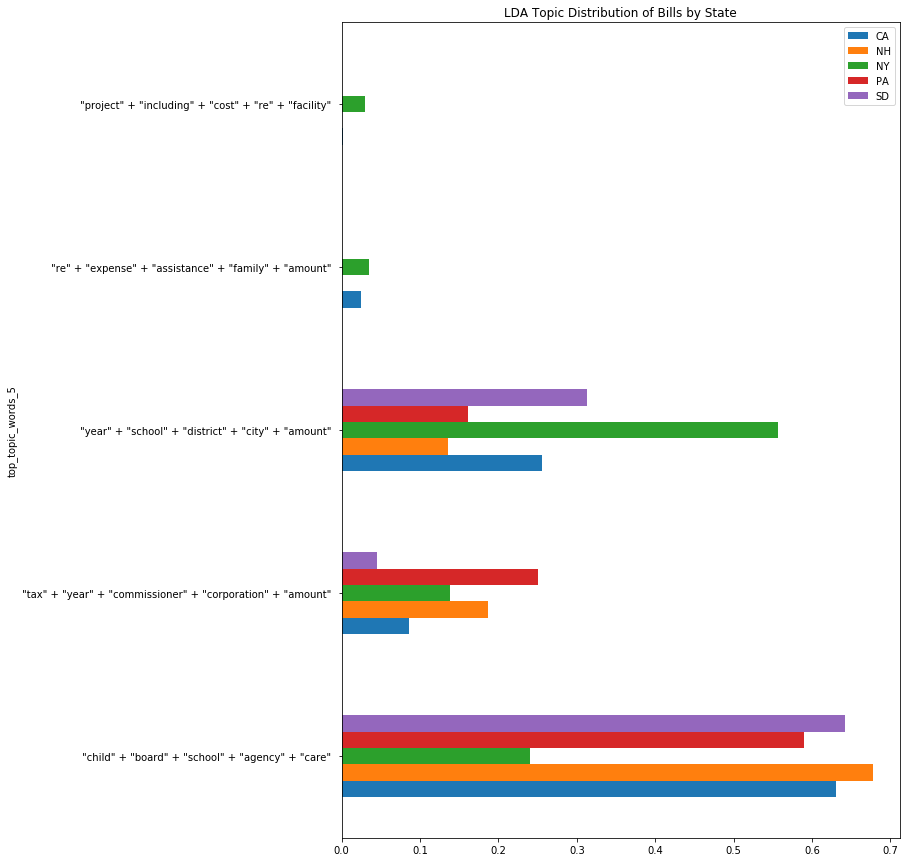

In [23]:
# Here we get a picture of how common these topics are in each state. You'll notice that some topics are much larger than other,
# and that some states dominate particular topics
summary_5 = pd.DataFrame({'Count': df.groupby(['top_topic_5','top_topic_words_5','state'])['state'].count()}).reset_index()
pivoted_5 = summary_5.pivot(index='top_topic_words_5', columns='state', values='Count')
pivoted_5.fillna(0, inplace=True)

# Calculate topic count as fraction of bills for that state
bill_totals_5 = pivoted_5.sum(axis=0)
pivoted_5 = pivoted_5/bill_totals_5

pivoted_5['top_topic_words_5'] = pivoted_5.index.values

dfp_5 = pivoted_5 
dfp_5["top_topic_words_5"] = dfp_5["top_topic_words_5"].str.replace('\d+', '')
dfp_5["top_topic_words_5"] = dfp_5["top_topic_words_5"].str.replace('\*', '')
dfp_5["top_topic_words_5"] = dfp_5["top_topic_words_5"].str.replace('\.', '')
dfp_5["top_topic_words_5"] = dfp_5["top_topic_words_5"].apply(lambda x: "+".join(x.split("+")[0:5]))
dfp_5.set_index('top_topic_words_5', inplace=True)

# Plot.
pd.concat(
    [dfp_5.CA, dfp_5.NH, dfp_5.NY, dfp_5.PA, dfp_5.SD],
    axis=1).plot.barh(title='LDA Topic Distribution of Bills by State',figsize=(10,15))

print("Done")

In [24]:
# Now we use LDAVis, a pre-built package built specifically for visualizing LDA models.
ldavis_5 = pyLDAvis.gensim.prepare(ldamodel_5, corpus, dictionary)

# In most cases, you'd probably want to save the interactive LDAVis visualization as a self-contained HTML file.
pyLDAvis.save_html(ldavis_5, '../docs/assets/notebook_assets/lda_5.html')

# For the demo website we built, we also exported the values that LDAVis calculated in JSON format.
# On our website, we used this JSON as input to the LDAVis HTML shell, with some custom DataKind styling layered on top of it.
# That custom styling is beyond the scope of this notebook, but the JSON export is below.
pyLDAvis.save_json(ldavis_5, '../docs/assets/notebook_assets/lda_5.json')

C:\Users\Sarah\Anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




### Ten-Topic LDA Model

In [25]:
# Our initial five-topic model was a great start. However, do five topics adequately capture all that is
# going on in our dataset? Several of our topics are rather large and generic. So, we try running a larger,
# ten-topic model as well, following the same procedures as above.
ldamodel_10 = gensim.models.ldamodel.LdaModel(corpus, num_topics = 10, id2word = dictionary, passes = 20, random_state = 1)
topics_10 = ldamodel_10.print_topics(num_topics = 10)
topics_map_10 = {}
for t in topics_10:
    topics_map_10[t[0]] = t[1]
print("Done")

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.



Done


In [45]:
# Calculate and store top topic for each document
topics_arr_10 = []
top_topic_10 = []
top_topic_words_10 = []
for i in df['text_pp']:
    t = get_topics(i, ldamodel_10, dictionary)    
    maxval = max(t,key=itemgetter(1))[0] 
    topics_arr_10.append(t)
    top_topic_10.append(maxval)
    top_topic_words_10.append(topics_map_10[maxval])
df['topics_10']    = topics_arr_10
df['top_topic_10'] = top_topic_10
df['top_topic_words_10'] = top_topic_words_10
print("Done")

Done


<>:9: DeprecationWarning:

invalid escape sequence \d

<>:10: DeprecationWarning:

invalid escape sequence \*

<>:11: DeprecationWarning:

invalid escape sequence \.

<>:9: DeprecationWarning:

invalid escape sequence \d

<>:10: DeprecationWarning:

invalid escape sequence \*

<>:11: DeprecationWarning:

invalid escape sequence \.

<>:9: DeprecationWarning:

invalid escape sequence \d

<>:10: DeprecationWarning:

invalid escape sequence \*

<>:11: DeprecationWarning:

invalid escape sequence \.

<ipython-input-27-b287d1254237>:9: DeprecationWarning:

invalid escape sequence \d

<ipython-input-27-b287d1254237>:10: DeprecationWarning:

invalid escape sequence \*

<ipython-input-27-b287d1254237>:11: DeprecationWarning:

invalid escape sequence \.



Done


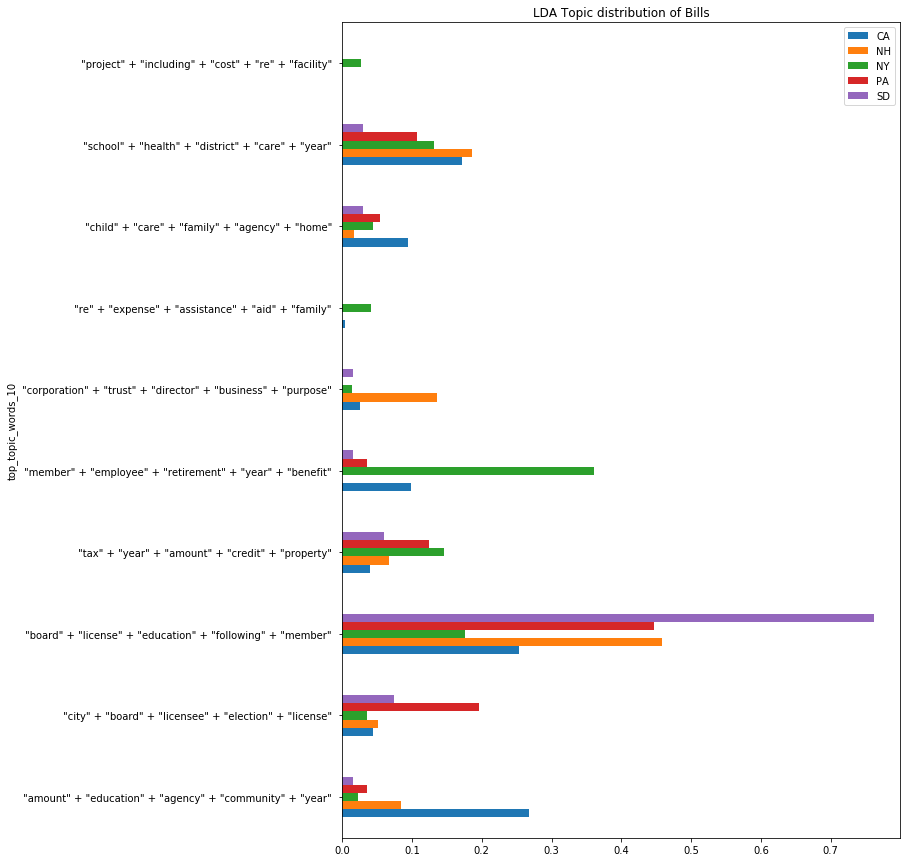

In [27]:
# Calculate and plot distribution of topics by state
summary_10 = pd.DataFrame({'Count': df.groupby(['top_topic_10','top_topic_words_10','state'])['state'].count()}).reset_index()
pivoted_10 = summary_10.pivot(index='top_topic_words_10', columns='state', values='Count')
pivoted_10.fillna(0, inplace=True)
bill_totals_10 = pivoted_10.sum(axis=0)
pivoted_10 = pivoted_10/bill_totals_10
pivoted_10['top_topic_words_10'] = pivoted_10.index.values
dfp_10 = pivoted_10 
dfp_10["top_topic_words_10"] = dfp_10["top_topic_words_10"].str.replace('\d+', '')
dfp_10["top_topic_words_10"] = dfp_10["top_topic_words_10"].str.replace('\*', '')
dfp_10["top_topic_words_10"] = dfp_10["top_topic_words_10"].str.replace('\.', '')
dfp_10["top_topic_words_10"] = dfp_10["top_topic_words_10"].apply(lambda x: "+".join(x.split("+")[0:5]))
dfp_10.set_index('top_topic_words_10', inplace=True)
pd.concat(
    [dfp_10.CA, dfp_10.NH, dfp_10.NY, dfp_10.PA, dfp_10.SD],
    axis=1).plot.barh(title='LDA Topic distribution of Bills',figsize=(10,15))
print("Done")

In [28]:
# LDAVis for 10-topic model
ldavis_10 = pyLDAvis.gensim.prepare(ldamodel_10, corpus, dictionary)
pyLDAvis.save_json(ldavis_10, '../docs/assets/notebook_assets/lda_10.json')
pyLDAvis.save_html(ldavis_10, '../docs/assets/notebook_assets/lda_10.html')
print("Done")

C:\Users\Sarah\Anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




Done


### Three-Topic LDA Model

In [7]:
# Often, large topics split into smamller, more specific sub-topics as the number of topics increases; we saw this
# when we moved from a five-topic to a ten-topic model. The more cohesive a topic is, the sooner it will split off from
# a larger topic. Since we had three very large topics in our initial five-topic model, it is worth seeing what a
# three-topic model will yield. Will the two small topics be reabsorbed into the three large topics? Or are they so cohesive
# that they will persist even in a three-topic model?
ldamodel_3 = gensim.models.ldamodel.LdaModel(corpus, num_topics = 3, id2word = dictionary, passes = 20, random_state = 1)
topics_3 = ldamodel_3.print_topics(num_topics = 3)
topics_map_3 = {}
for t in topics_3:
    topics_map_3[t[0]] = t[1]
print("Done")

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python su

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

C:\Users\Sarah\Anaconda3\lib\site-packages\gensim\models\ldamodel.py:826: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.



Done


In [10]:
# Calculate and store top topic for each document
topics_arr_3 = []
top_topic_3 = []
top_topic_words_3 = []
for i in df['text_pp']:
    t = get_topics(i, ldamodel_3, dictionary)    
    maxval = max(t,key=itemgetter(1))[0] 
    topics_arr_3.append(t)
    top_topic_3.append(maxval)
    top_topic_words_3.append(topics_map_3[maxval])
df['topics_3']    = topics_arr_3
df['top_topic_3'] = top_topic_3
df['top_topic_words_3'] = top_topic_words_3
print("Done")

Done


In [11]:
# Calculate and plot distribution of topics by state
summary_3 = pd.DataFrame({'Count': df.groupby(['top_topic_3','top_topic_words_3','state'])['state'].count()}).reset_index()
pivoted_3 = summary_3.pivot(index='top_topic_words_3', columns='state', values='Count')
pivoted_3.fillna(0, inplace=True)
bill_totals_3 = pivoted_3.sum(axis=0)
pivoted_3 = pivoted_3/bill_totals_3
pivoted_3['top_topic_words_3'] = pivoted_3.index.values
dfp_3 = pivoted_3 
dfp_3["top_topic_words_3"] = dfp_3["top_topic_words_3"].str.replace('\d+', '')
dfp_3["top_topic_words_3"] = dfp_3["top_topic_words_3"].str.replace('\*', '')
dfp_3["top_topic_words_3"] = dfp_3["top_topic_words_3"].str.replace('\.', '')
dfp_3["top_topic_words_3"] = dfp_3["top_topic_words_3"].apply(lambda x: "+".join(x.split("+")[0:5]))
dfp_3.set_index('top_topic_words_3', inplace=True)
pd.concat(
    [dfp_3.CA, dfp_3.NH, dfp_3.NY, dfp_3.PA, dfp_3.SD],
    axis=1).plot.barh(title='LDA Topic distribution of Bills',figsize=(10,15))
print("Done")

<>:9: DeprecationWarning:

invalid escape sequence \d

<>:10: DeprecationWarning:

invalid escape sequence \*

<>:11: DeprecationWarning:

invalid escape sequence \.

<>:9: DeprecationWarning:

invalid escape sequence \d

<>:10: DeprecationWarning:

invalid escape sequence \*

<>:11: DeprecationWarning:

invalid escape sequence \.

<>:9: DeprecationWarning:

invalid escape sequence \d

<>:10: DeprecationWarning:

invalid escape sequence \*

<>:11: DeprecationWarning:

invalid escape sequence \.

<ipython-input-11-592ea23db4c0>:9: DeprecationWarning:

invalid escape sequence \d

<ipython-input-11-592ea23db4c0>:10: DeprecationWarning:

invalid escape sequence \*

<ipython-input-11-592ea23db4c0>:11: DeprecationWarning:

invalid escape sequence \.



Done


In [ ]:
# LDAVis for 3-topic model
ldavis_3 = pyLDAvis.gensim.prepare(ldamodel_3, corpus, dictionary)
pyLDAvis.save_html(ldavis_3, '../docs/assets/notebook_assets/lda_3.html')
pyLDAvis.save_json(ldavis_3, '../docs/assets/notebook_assets/lda_3.json')
print("Done")

## Model Comparison: Sankey Diagram

In [48]:
# We can get a general idea of the relationships between the topics in each model by looking at their terms
# and relative sizes. However, it would be nice to also see how individual documents are assigned to specific
# topics in each model. We can do this with a Sankey diagram, which is used to visualized flows from category
# to category. Note that we have to manually label each topic, based on what we observed from the LDAVis.

# Generate data frames that sum the number of documents that flow between each pair of topics in the models
three_to_five = df.groupby(['top_topic_3', 'top_topic_5']).size().reset_index(name='count')
three_to_five['top_topic_5'] = three_to_five['top_topic_5'].replace([0, 1, 2, 3, 4], [3, 4, 5, 6, 7])

five_to_ten = df.groupby(['top_topic_5', 'top_topic_10']).size().reset_index(name='count')
five_to_ten['top_topic_5'] = five_to_ten['top_topic_5'].replace([0, 1, 2, 3, 4], [3, 4, 5, 6, 7])
five_to_ten['top_topic_10'] = five_to_ten['top_topic_10'].replace([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [8, 9, 10, 11, 12, 13, 14, 15, 16, 17])

# Combining into one data frame to pass to plotly, which will make the figure
three_to_five = three_to_five.rename(columns={"top_topic_3": "source", "top_topic_5": "target"})
five_to_ten = five_to_ten.rename(columns={"top_topic_5": "source", "top_topic_10": "target"})
                                          
combined = pd.concat([three_to_five, five_to_ten])

# Creating and saving Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node = dict(pad = 15,
                      thickness = 20,
                      line = dict(color = "black", width = 0.5),
                      label = ["Three Topic: Taxes",
                               "Three Topic: School Governance",
                               "Three Topic: Campus Construction",
                               "Five Topic: Taxes",
                               "Five Topic: Licensing",
                               "Five Topic: Child Welfare/Assistance",
                               "Five Topic: Campus Construction",
                               "Five Topic: School Governance/Pensions",
                               "Ten Topic: Foster Care",
                               "Ten Topic: Licensing",
                               "Ten Topic: Budgeting",
                               "Ten Topic: Campus Construction",
                               "Ten Topic: Pensions",
                               "Ten Topic: Child Welfare/Assistance",
                               "Ten Topic: Taxes",
                               "Ten Topic: Corporate Governance",
                               "Ten Topic: Gambling Licensing/Revenue",
                               "Ten Topic: School Governance"],
                      color = "#e57300"), 
          link = dict(
                  source = combined['source'],
                  target = combined['target'],
                  value = combined['count']))])
fig.show()
fig.write_image("../docs/assets/notebook_assets/sankey.png", width = 1000, height = 750)
plotly.offline.plot(fig, filename='../docs/assets/notebook_assets/sankey.html') 

'../docs/assets/notebook_assets/sankey.html'